In [1]:
# import basic modules
import sys
import os
import time
import numpy as np
import h5py
import pandas as pd
import scipy
import torch
import matplotlib
import matplotlib.pyplot as plt
import warnings
import PIL.Image

sys.path.insert(0, '/lab_data/hendersonlab/code/utils/')
import prf_utils

nsd_path = '/lab_data/hendersonlab/datasets/nsd_preproc'
data_folder = os.path.join(nsd_path, 'data')
labels_folder = os.path.join(nsd_path, 'labels')
stim_folder = os.path.join(nsd_path, 'stimuli')
rois_folder = os.path.join(nsd_path, 'rois')

In [2]:
subject = 1

### Load the pRF parameters

Estimated from independent mapping task.

this file is created in: /lab_data/hendersonlab/datasets/nsd_preproc/code/proc_rois.py

In [3]:
fn = os.path.join(rois_folder, 'S%d_prf_params.npy'%subject)
print(fn)
prf_info = np.load(fn, allow_pickle=True).item()

/lab_data/hendersonlab/datasets/nsd_preproc/rois/S1_prf_params.npy


Angle is in degrees (0-360, polar angle position)

Eccen is in degrees visual angle

Size is in degrees visual angle

(Note the stimulus is a square, 8.4 degrees each side)

Exponent and gain are additional params of the fit, see: https://cvnlab.slite.page/p/G5dUBGBxMo/Functional-data-pRF-fLoc

R2 is overall fit of the pRF model

In [4]:
prf_info

{'angle': array([180.00067139, 157.50010681, 216.79301453, ...,  20.92711449,
         64.57306671,  49.92634583], shape=(19738,)),
 'eccen': array([ 8.39111423,  5.93869114, 10.88340664, ...,  5.79722786,
         1.33985841,  4.4614048 ], shape=(19738,)),
 'size': array([1.98167551, 0.36442772, 3.70792842, ..., 7.60029364, 4.29885483,
        5.45458984], shape=(19738,)),
 'exponent': array([0.12190896, 0.4279249 , 0.257649  , ..., 0.3361772 , 0.28697029,
        0.46810505], shape=(19738,)),
 'gain': array([1.98470223, 3.31291366, 0.9324913 , ..., 0.36606014, 1.00589669,
        1.12788999], shape=(19738,)),
 'rsq': array([ 1.10531449e-02,  9.53674316e-07,  1.69870853e-02, ...,
         5.47463322e-02, -1.12090473e-01,  1.20422840e-02], shape=(19738,))}

In [5]:
# Load info about rois and voxels in the data
# ROI = region of interest. These are visual areas we want to focus on for analysis.
fn = os.path.join(rois_folder, 'S%d_voxel_roi_info.npy'%subject)
print(fn)
rinfo = np.load(fn, allow_pickle=True).item()
# this is a dictionary that contains information about which voxels our data will include.
# voxel_mask is the whole set of voxels we're focusing on. basically all of visual cortex.

voxel_mask = rinfo['voxel_mask']
voxel_index = rinfo['voxel_idx']
voxel_ncsnr = rinfo['ncsnr_full']
brain_nii_shape = rinfo['brain_nii_shape']

/lab_data/hendersonlab/datasets/nsd_preproc/rois/S1_voxel_roi_info.npy


In [6]:
n_vox = np.sum(voxel_mask)

a = prf_info['angle']
e = prf_info['eccen']
s = prf_info['size']
exp = prf_info['exponent']
    
# Converting them into [x, y] coordinates, from polar
# The units here are degrees visual angle
x_mapping, y_mapping = prf_utils.pol_to_cart(a,e)
x_mapping = np.minimum(np.maximum(x_mapping, -7), 7)
# S = pRF size, sigma of the Gaussian function.
y_mapping = np.minimum(np.maximum(y_mapping, -7), 7)
s_mapping = np.minimum(s, 8.4)

print('there are %d nans in x_mapping'%np.sum(np.isnan(x_mapping)))
print('there are %d nans in y_mapping'%np.sum(np.isnan(y_mapping)))
print('there are %d nans in s_mapping'%np.sum(np.isnan(s_mapping)))

there are 0 nans in x_mapping
there are 0 nans in y_mapping
there are 0 nans in s_mapping


Text(0.5, 1.0, 'pRF sigma (degrees)')

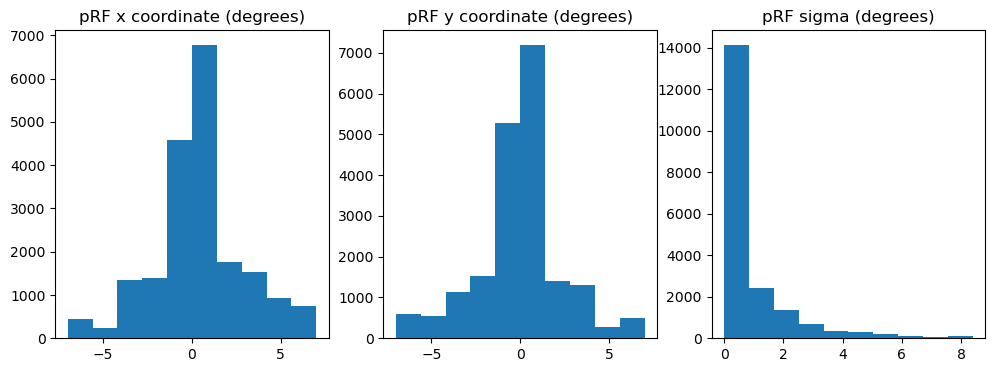

In [7]:
plt.figure(figsize=(12, 4))

plt.subplot(1,3,1)
plt.hist(x_mapping);
plt.title('pRF x coordinate (degrees)')

plt.subplot(1,3,2)
plt.hist(y_mapping);
plt.title('pRF y coordinate (degrees)')

plt.subplot(1,3,3)
plt.hist(s_mapping);
plt.title('pRF sigma (degrees)')


In [8]:
data_filename = os.path.join(stim_folder, 'S%d_stimuli_224.h5py'%subject)
print(data_filename)

t = time.time()
with h5py.File(data_filename, 'r') as data_set:
    images = np.copy(data_set['/stimuli'])
    data_set.close() 
elapsed = time.time() - t
print('Took %.5f seconds to load file'%elapsed)


/lab_data/hendersonlab/datasets/nsd_preproc/stimuli/S1_stimuli_224.h5py
Took 6.29436 seconds to load file


In [9]:
data_filename = os.path.join(data_folder, 'S%d_betas_avg_bigmask.hdf5'%subject)
print(data_filename)

t = time.time()
with h5py.File(data_filename, 'r') as data_set:
    voxel_data = np.copy(data_set['/betas'])
    data_set.close() 
elapsed = time.time() - t
print('Took %.5f seconds to load file'%elapsed)


/lab_data/hendersonlab/datasets/nsd_preproc/data/S1_betas_avg_bigmask.hdf5


Took 7.08689 seconds to load file


In [10]:
images.shape, voxel_data.shape

((10000, 3, 224, 224), (10000, 19738))

In [11]:
def get_roi_vox(roi_name = 'FFA-2'):

  if roi_name in rinfo['ret_prf_roi_names']:
    ind_num = rinfo['ret_prf_roi_names'][roi_name]
    roi_inds = rinfo['roi_labels_retino'][voxel_mask]==ind_num

  elif roi_name in rinfo['floc_face_roi_names']:
    ind_num = rinfo['floc_face_roi_names'][roi_name]
    roi_inds = rinfo['roi_labels_face'][voxel_mask]==ind_num

  elif roi_name in rinfo['floc_place_roi_names']:
    ind_num = rinfo['floc_place_roi_names'][roi_name]
    roi_inds = rinfo['roi_labels_place'][voxel_mask]==ind_num

  elif roi_name in rinfo['floc_body_roi_names']:
    ind_num = rinfo['floc_body_roi_names'][roi_name]
    roi_inds = rinfo['roi_labels_body'][voxel_mask]==ind_num

  return roi_inds


### Plot examples of pRF for voxels, in image space

In [12]:
# roi_name = 'hV4' 
# roi_name = 'V2v'
# roi_name = 'V2d'
# roi_name = 'PPA'
# roi_name = 'FFA-1'
roi_name = 'V1v'
roi_inds = get_roi_vox(roi_name)
roi_inds_num = np.where(roi_inds)[0]
np.sum(roi_inds)

np.int64(594)

In [13]:
n_vox_to_plot = 10

rsq = prf_info['rsq']
best_vox = roi_inds_num[np.flip(np.argsort(rsq[roi_inds]))]
best_vox = best_vox[0:n_vox_to_plot]
best_vox


array([7577, 7872, 9437, 8066, 7211, 7559, 8337, 6818, 7192, 7477])

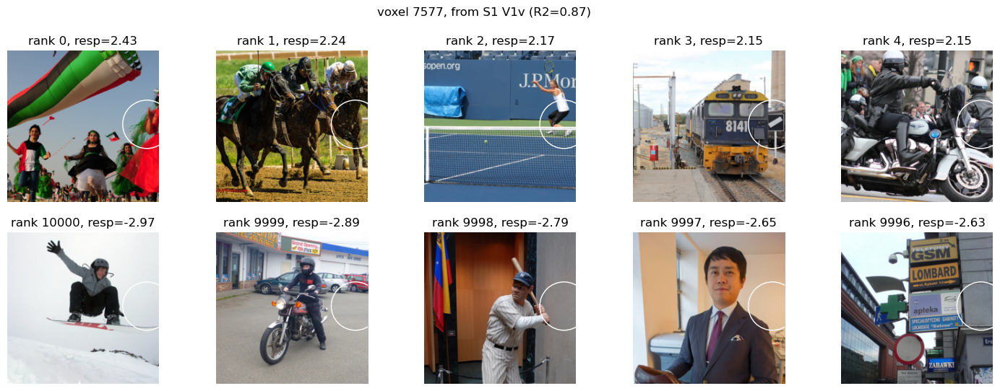

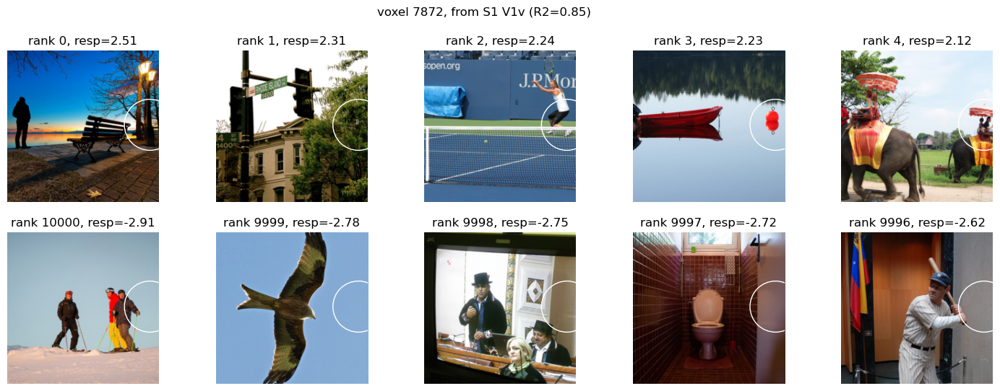

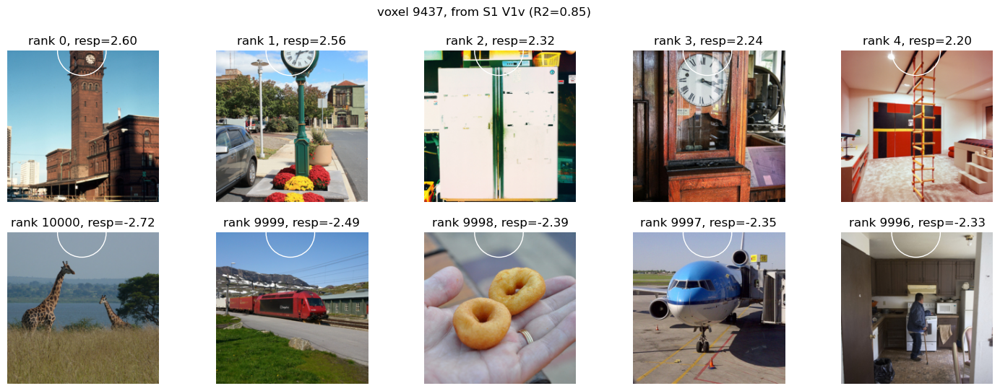

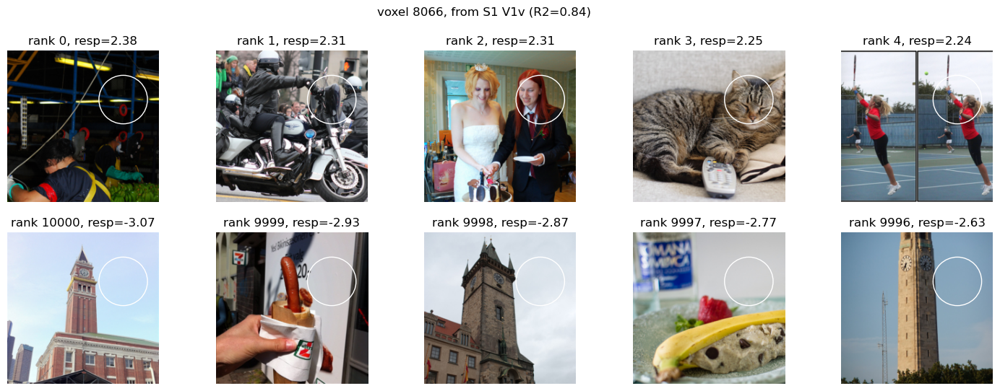

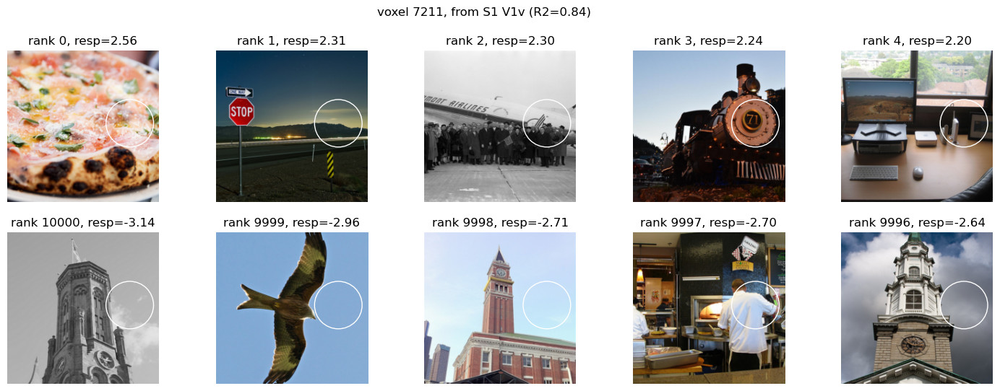

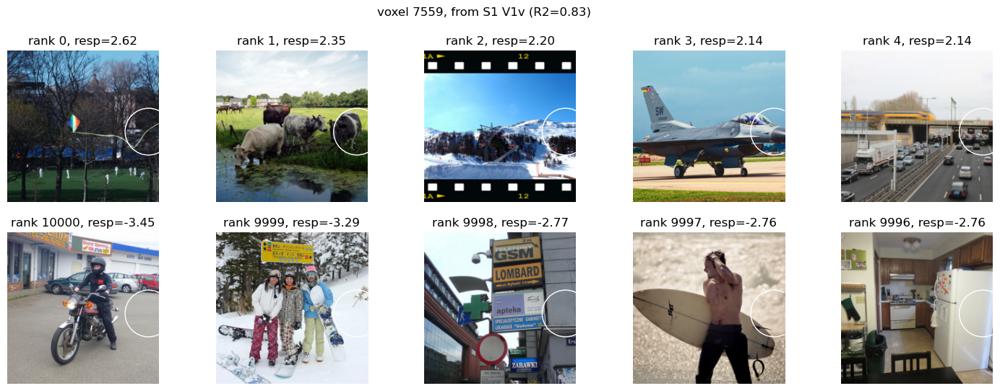

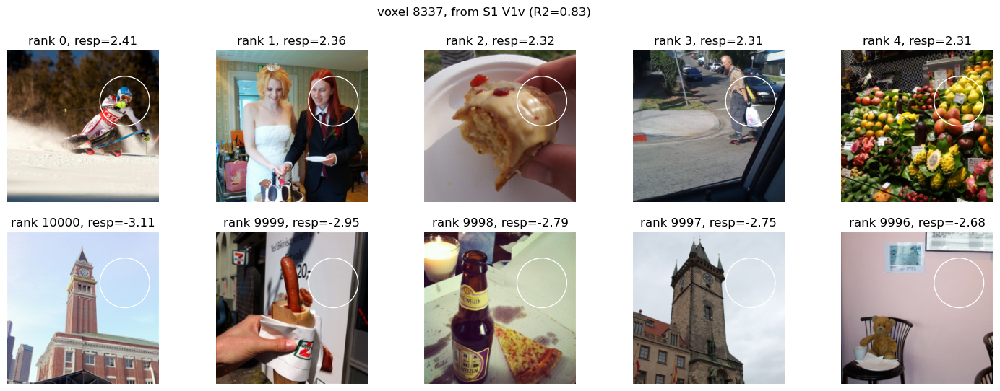

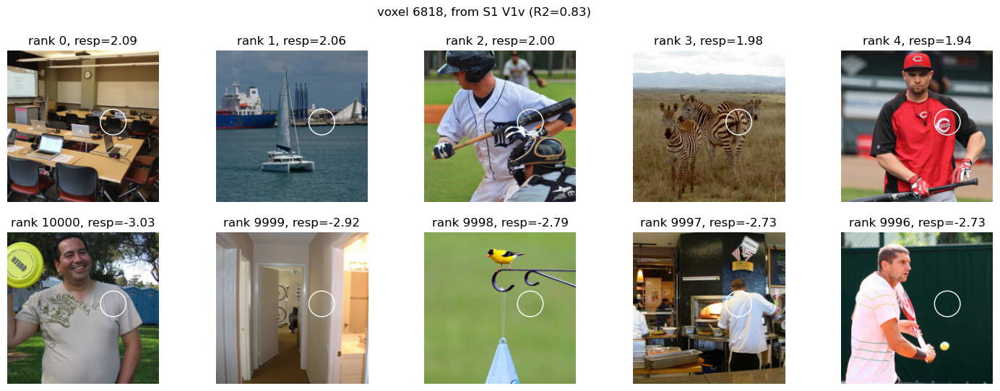

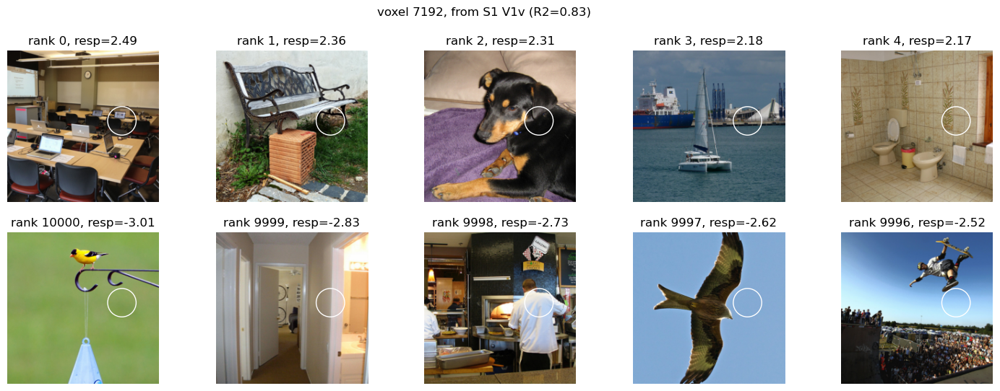

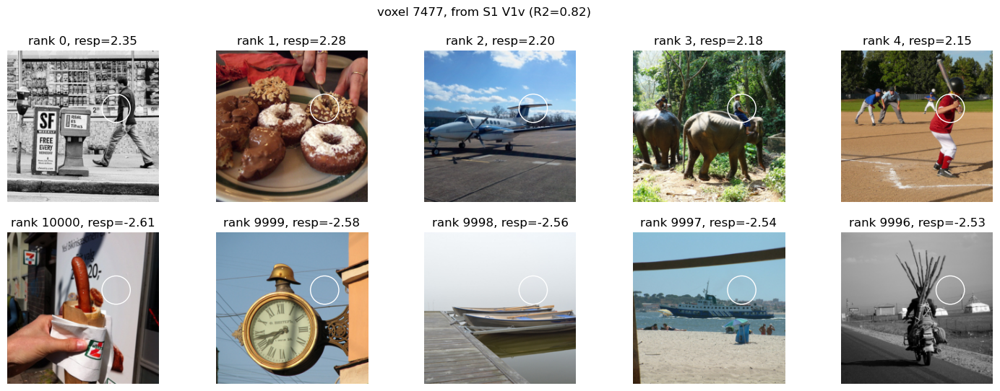

In [14]:
for vv in best_vox:

    image_ordering = np.argsort(voxel_data[:,vv])
    top_n = 5
    top_trials = np.flip(image_ordering)[0:top_n]
    bottom_trials = image_ordering[0:top_n]

    # the images are 8.4 degrees wide, so we divide by 8.4 to get into a normalized space
    # now values span from -0.5:0.5 in image space
    x = x_mapping[vv] / 8.4
    y = y_mapping[vv] / 8.4
    sigma = s_mapping[vv] / 8.4
    
    n_pix = images.shape[2]
    prf_2d = prf_utils.gauss_2d(center=[x,y], sd=sigma, patch_size=n_pix)

    # Next we convert the values into image coordinates, relative to actual n_pix
    # invert y direction here for imshow
    center_in_image = np.array((n_pix/2 + x*n_pix, n_pix/2 - n_pix*y))
    size_in_image = 2*sigma*n_pix

    plt.figure(figsize=(18,6));
    for ii, index in enumerate(top_trials):
        ax = plt.subplot(2,top_n,ii+1);
        image = np.moveaxis(images[index], [0], [2])
        plt.imshow(image, cmap='gray')
        circ = matplotlib.patches.Circle(center_in_image, size_in_image, 
                                                     color = 'w', fill=False)
        ax.add_artist(circ)
        plt.axis('off')
        plt.title('rank %d, resp=%.2f'%(ii, voxel_data[index,vv]))
        
    for ii, index in enumerate(bottom_trials):
        ax = plt.subplot(2,top_n,top_n+ii+1);
        image = np.moveaxis(images[index], [0], [2])
        plt.imshow(image, cmap='gray')
        circ = matplotlib.patches.Circle(center_in_image, size_in_image, 
                                                     color = 'w', fill=False)
        ax.add_artist(circ)
        plt.axis('off')
        plt.title('rank %d, resp=%.2f'%(10000-ii, voxel_data[index,vv]))
    
        
    plt.suptitle('voxel %d, from S%d %s (R2=%.2f)'%(vv, subject, roi_name, rsq[vv]))
